In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import cv2
import matplotlib.pyplot as plt

In [ ]:
labels = os.listdir("/content/drive/MyDrive/Dataset/train")

In [ ]:
labels

['yawn', 'Open', 'no_yawn', 'Closed']

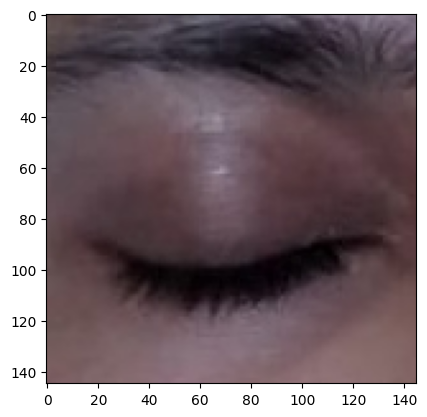

In [ ]:
plt.imshow(plt.imread("/content/drive/MyDrive/Dataset/train/Closed/_0.jpg"))


In [ ]:
a = plt.imread("/content/drive/MyDrive/Dataset/train/yawn/10.jpg")

In [ ]:
a.shape

(480, 640, 3)

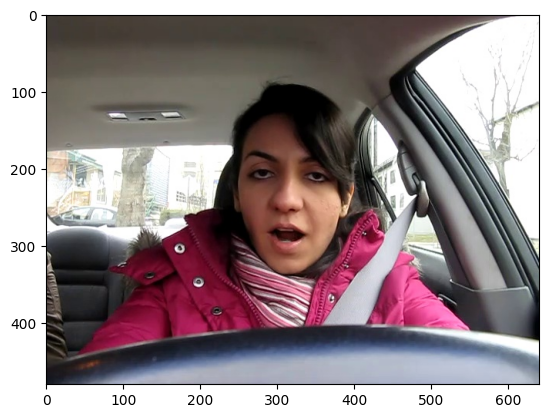

In [ ]:
plt.imshow(plt.imread("/content/drive/MyDrive/Dataset/train/yawn/10.jpg"))

In [ ]:
def face_for_yawn(direc="/content/drive/MyDrive/Dataset/train", face_cas_path="/content/haarcascade_frontalface_default.xml"):
    yaw_no = []
    IMG_SIZE = 145
    categories = ["yawn", "no_yawn"]
    for category in categories:
        path_link = os.path.join(direc, category)
        class_num1 = categories.index(category)
        print(class_num1)
        for image in os.listdir(path_link):
            image_array = cv2.imread(os.path.join(path_link, image), cv2.IMREAD_COLOR)
            face_cascade = cv2.CascadeClassifier(face_cas_path)
            faces = face_cascade.detectMultiScale(image_array, 1.3, 5)
            for (x, y, w, h) in faces:
                img = cv2.rectangle(image_array, (x, y), (x+w, y+h), (0, 255, 0), 2)
                roi_color = img[y:y+h, x:x+w]
                resized_array = cv2.resize(roi_color, (IMG_SIZE, IMG_SIZE))
                yaw_no.append([resized_array, class_num1])
    return yaw_no


yawn_no_yawn = face_for_yawn()

0
1


In [ ]:
def get_data(dir_path="/content/drive/MyDrive/Dataset/train", face_cas="/content/haarcascade_frontalface_default.xml", eye_cas="/content/haarcascade.xml"):
    labels = ['Closed', 'Open']
    IMG_SIZE = 145
    data = []
    for label in labels:
        path = os.path.join(dir_path, label)
        class_num = labels.index(label)
        class_num +=2
        print(class_num)
        for img in os.listdir(path):
            try:
                img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_COLOR)
                resized_array = cv2.resize(img_array, (IMG_SIZE, IMG_SIZE))
                data.append([resized_array, class_num])
            except Exception as e:
                print(e)
    return data

In [ ]:
data_train = get_data()

2
3


In [ ]:
def append_data():
    yaw_no = face_for_yawn()
    data = get_data()

    # Flatten the list of lists into a single list
    combined_data = []
    for item in yaw_no:
        combined_data.append(item)
    for item in data:
        combined_data.append(item)

    return combined_data

new_data = append_data()

0
1
2
3


In [ ]:
X = []
y = []
for feature, label in new_data:
    X.append(feature)
    y.append(label)

In [ ]:
X = np.array(X)
X = X.reshape(-1, 145, 145, 3)

In [ ]:
from sklearn.preprocessing import LabelBinarizer
label_bin = LabelBinarizer()
y = label_bin.fit_transform(y)

In [ ]:
y = np.array(y)

In [ ]:
from sklearn.model_selection import train_test_split
seed = 42
test_size = 0.30
X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=seed, test_size=test_size)

In [ ]:
# Further split training data into training and validation sets
validation_size = 0.20  # 20% of training data for validation
X_train, X_validation, y_train, y_validation = train_test_split(X_train, y_train, random_state=seed, test_size=validation_size)

In [ ]:
len(X_test)

578

In [ ]:
from tensorflow.keras.layers import Input, Lambda, Dense, Flatten, Conv2D, MaxPooling2D, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf

In [ ]:
train_generator = ImageDataGenerator(rescale=1/255, zoom_range=0.2, horizontal_flip=True, rotation_range=30)
test_generator = ImageDataGenerator(rescale=1/255)

train_generator = train_generator.flow(np.array(X_train), y_train, shuffle=False)
test_generator = test_generator.flow(np.array(X_test), y_test, shuffle=False)

**Convolutional Neural Network**

Model: "sequential_24"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_48 (Conv2D)          (None, 143, 143, 256)     7168      
                                                                 
 max_pooling2d_48 (MaxPooli  (None, 71, 71, 256)       0         
 ng2D)                                                           
                                                                 
 conv2d_49 (Conv2D)          (None, 69, 69, 128)       295040    
                                                                 
 max_pooling2d_49 (MaxPooli  (None, 34, 34, 128)       0         
 ng2D)                                                           
                                                                 
 conv2d_50 (Conv2D)          (None, 32, 32, 64)        73792     
                                                                 
 max_pooling2d_50 (MaxPooli  (None, 16, 16, 64)      

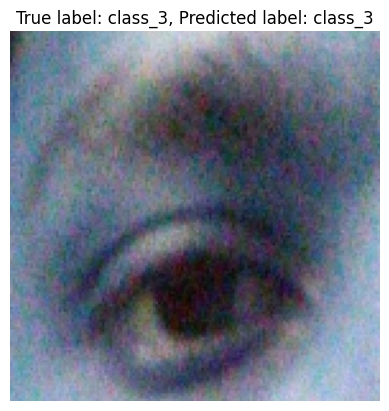

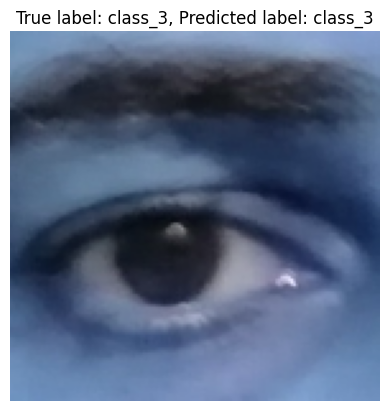

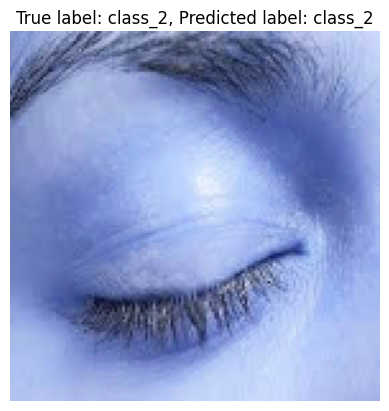

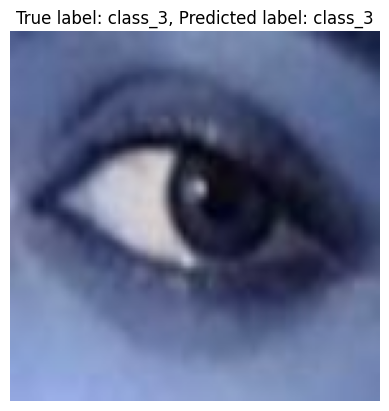

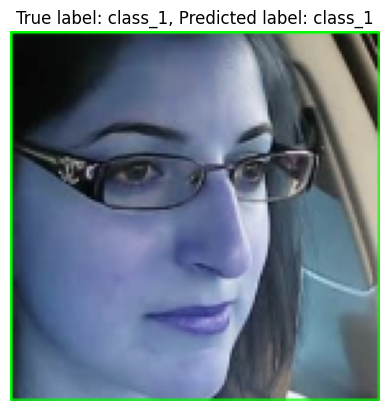

...

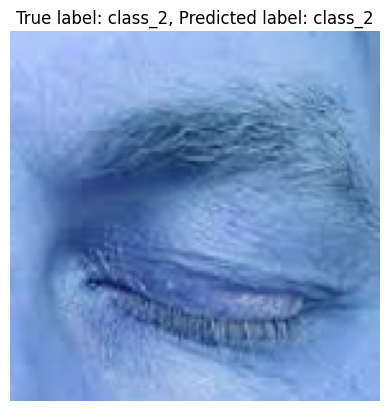

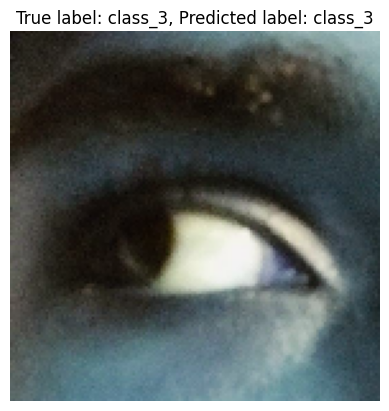

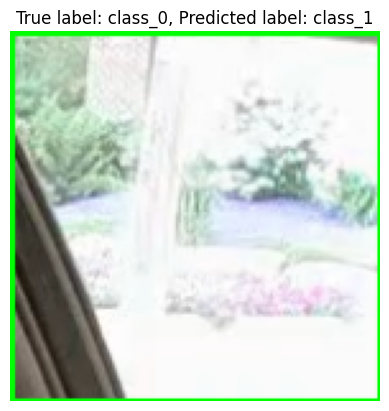

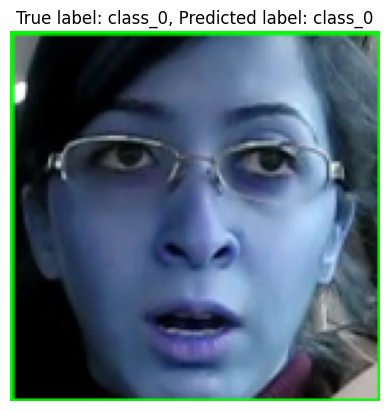

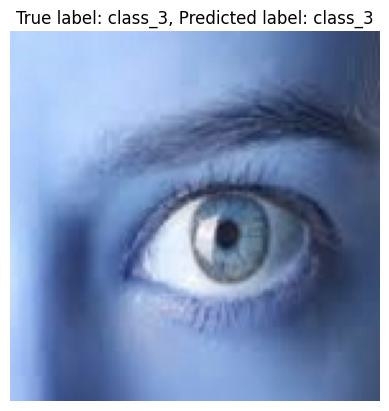

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
import numpy as np
from sklearn.metrics import classification_report

# Define ImageDataGenerator for data normalization
test_datagen = ImageDataGenerator(rescale=1/255)

# Create generator objects
test_generator = test_datagen.flow(X_test, y_test, shuffle=False)

# Define the model
model = Sequential()

model.add(Conv2D(256, (3, 3), activation="relu", input_shape=(X_train.shape[1:])))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(128, (3, 3), activation="relu"))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3), activation="relu"))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(32, (3, 3), activation="relu"))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(64, activation="relu"))
model.add(Dense(4, activation="softmax"))

model.compile(loss="categorical_crossentropy", metrics=["accuracy"], optimizer="adam")

model.summary()

# Train the model
history = model.fit(train_generator, epochs=100, validation_data=test_generator, validation_steps=len(test_generator))

# Evaluate the model on test data
evaluation = model.evaluate(test_generator)
print("Test Loss:", evaluation[0])
print("Test Accuracy:", evaluation[1])


import matplotlib.pyplot as plt

# Predict on test data
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)

# Manually specify class labels
class_labels = ["class_0", "class_1", "class_2", "class_3"]

# Convert one-hot encoded true labels to single labels
true_classes = np.argmax(y_test, axis=1)

# Display true labels and predictions for some images
num_images_to_display = 20
for i in range(num_images_to_display):
    true_label = class_labels[true_classes[i]]
    predicted_label = class_labels[predicted_classes[i]]

    # Display the image
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(f"True label: {true_label}, Predicted label: {predicted_label}")
    plt.show()




In [ ]:
from sklearn.metrics import classification_report

# Get predicted classes and true classes
predictions = model.predict(test_generator)
predicted_classes = np.argmax(predictions, axis=1)
true_classes = np.argmax(y_test, axis=1)

# Manually specify class labels
class_labels = ["class_0", "class_1", "class_2", "class_3"]

# Generate classification report
report = classification_report(true_classes, predicted_classes, target_names=class_labels)
print("Classification Report:")
print(report)


19/19 [==============================] - 1s 26ms/step
Classification Report:
              precision    recall  f1-score   support

     class_0       0.92      0.92      0.92        63
     class_1       0.92      0.92      0.92        74
     class_2       0.99      0.99      0.99       215
     class_3       1.00      0.99      0.99       226

    accuracy                           0.97       578
   macro avg       0.96      0.96      0.96       578
weighted avg       0.97      0.97      0.97       578



In [ ]:
model.save('cnn_model.h5')

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


**Recurrent Neural Network**

In [ ]:
import numpy as np

# Reshape X_train and X_test
X_train_reshaped = X_train.reshape(X_train.shape[0], X_train.shape[1], -1)
X_test_reshaped = X_test.reshape(X_test.shape[0], X_test.shape[1], -1)

# Convert to float32
X_train_reshaped = X_train_reshaped.astype('float32')
X_test_reshaped = X_test_reshaped.astype('float32')

# Normalize data if needed
# X_train_reshaped /= 255
# X_test_reshaped /= 255

# Now your input data should have the shape (number of samples, time steps, features)
print("X_train shape:", X_train_reshaped.shape)
print("X_test shape:", X_test_reshaped.shape)


X_train shape: (1077, 145, 435)
X_test shape: (578, 145, 435)


Model: "sequential_31"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_51 (LSTM)              (None, 145, 256)          708608    
                                                                 
 dropout_74 (Dropout)        (None, 145, 256)          0         
                                                                 
 batch_normalization_74 (Ba  (None, 145, 256)          1024      
 tchNormalization)                                               
                                                                 
 lstm_52 (LSTM)              (None, 145, 128)          197120    
                                                                 
 dropout_75 (Dropout)        (None, 145, 128)          0         
                                                                 
 batch_normalization_75 (Ba  (None, 145, 128)          512       
 tchNormalization)                                   

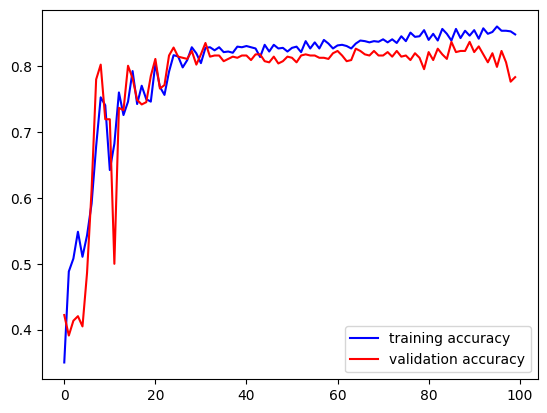

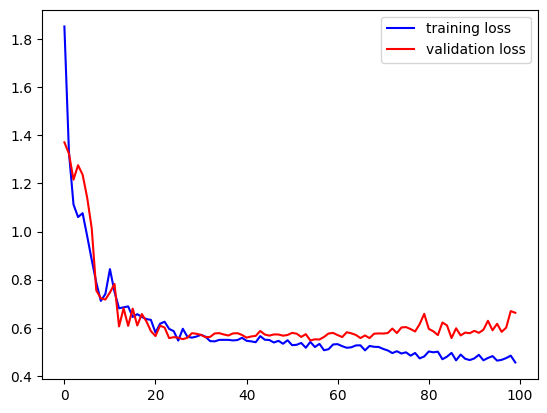

19/19 [==============================] - 2s 19ms/step


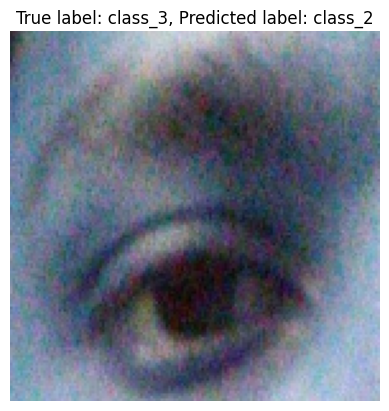

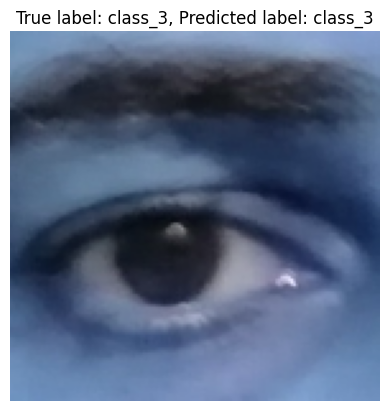

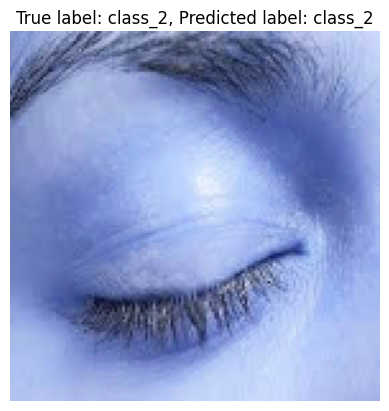

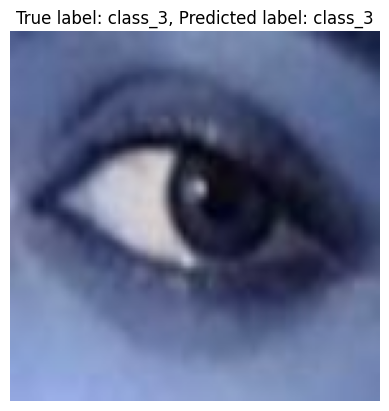

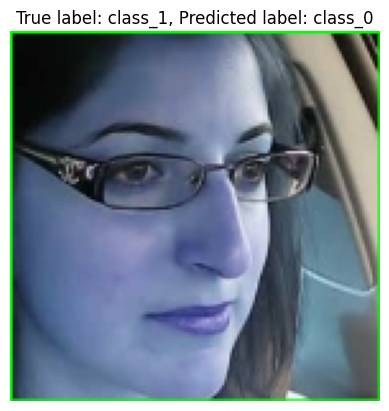

...

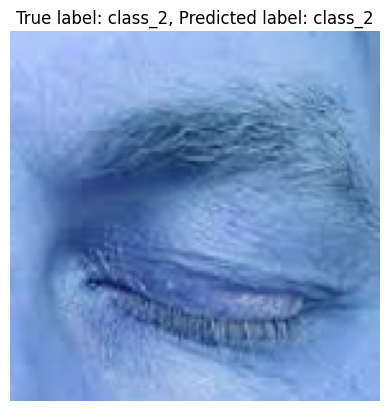

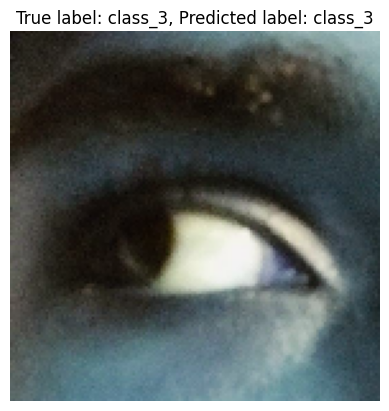

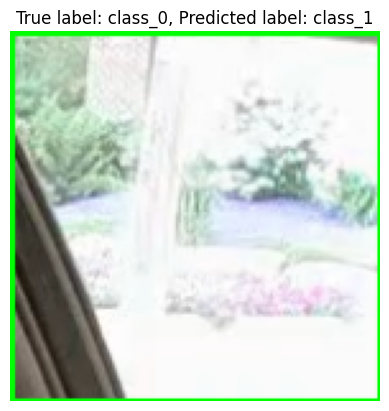

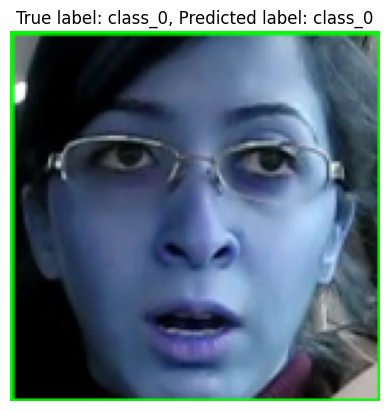

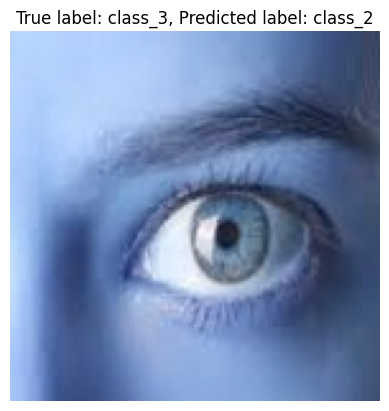

              precision    recall  f1-score   support

     class_0       0.57      0.92      0.71        63
     class_1       0.86      0.43      0.58        74
     class_2       0.75      0.96      0.84       215
     class_3       0.95      0.69      0.80       226

    accuracy                           0.78       578
   macro avg       0.78      0.75      0.73       578
weighted avg       0.82      0.78      0.78       578



In [111]:
from keras.models import Sequential
from keras.layers import LSTM, Dense, Dropout, BatchNormalization
from keras.optimizers import Adam
from keras.regularizers import l2
from keras.callbacks import ReduceLROnPlateau
from keras.constraints import max_norm
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

# Define the RNN model
rnn_model = Sequential()

rnn_model.add(LSTM(256, activation="tanh", return_sequences=True, input_shape=(X_train.shape[1], X_train.shape[2] * X_train.shape[3])))
rnn_model.add(Dropout(0.3))
rnn_model.add(BatchNormalization())

rnn_model.add(LSTM(128, activation="tanh", return_sequences=True))
rnn_model.add(Dropout(0.3))
rnn_model.add(BatchNormalization())

rnn_model.add(LSTM(128, activation="tanh"))
rnn_model.add(Dropout(0.3))
rnn_model.add(BatchNormalization())

rnn_model.add(Dense(128, activation="relu", kernel_regularizer=l2(0.001), kernel_constraint=max_norm(3)))
rnn_model.add(BatchNormalization())
rnn_model.add(Dropout(0.3))

rnn_model.add(Dense(4, activation="softmax"))

optimizer = Adam(lr=0.0005, clipnorm=1.0)
rnn_model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])

# Summary
rnn_model.summary()

# Adding learning rate scheduler
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.0001)

# Train the model
history = rnn_model.fit(X_train_reshaped, y_train, epochs=100, batch_size=64, validation_data=(X_test_reshaped, y_test), callbacks=[reduce_lr])

# Evaluation on test data
evaluation = rnn_model.evaluate(X_test_reshaped, y_test)
print("Test Loss:", evaluation[0])
print("Test Accuracy:", evaluation[1])

# Plotting
accuracy = history.history['accuracy']
val_accuracy = history.history['val_accuracy']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(len(accuracy))

plt.plot(epochs, accuracy, "b", label="training accuracy")
plt.plot(epochs, val_accuracy, "r", label="validation accuracy")
plt.legend()
plt.show()

plt.plot(epochs, loss, "b", label="training loss")
plt.plot(epochs, val_loss, "r", label="validation loss")
plt.legend()
plt.show()

# Predict on test data
predictions = rnn_model.predict(X_test_reshaped)
predicted_classes = np.argmax(predictions, axis=1)

# Manually specify class labels
class_labels = ["class_0", "class_1", "class_2", "class_3"]

# Convert one-hot encoded true labels to single labels
true_classes = np.argmax(y_test, axis=1)

# Display true labels and predictions for some images
num_images_to_display = 20
for i in range(num_images_to_display):
    true_label = class_labels[true_classes[i]]
    predicted_label = class_labels[predicted_classes[i]]

    # Display the image
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(f"True label: {true_label}, Predicted label: {predicted_label}")
    plt.show()

# Print classification report
print(classification_report(true_classes, predicted_classes, target_names=class_labels))


In [113]:
# Save the model architecture and weights
rnn_model.save("rnn_model.h5")


**Convolutional Recurrent Neural Network**

Model: "sequential_27"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_55 (Conv2D)          (None, 143, 143, 32)      896       
                                                                 
 max_pooling2d_55 (MaxPooli  (None, 71, 71, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_56 (Conv2D)          (None, 69, 69, 64)        18496     
                                                                 
 max_pooling2d_56 (MaxPooli  (None, 34, 34, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_57 (Conv2D)          (None, 32, 32, 128)       73856     
                                                                 
 max_pooling2d_57 (MaxPooli  (None, 16, 16, 128)     

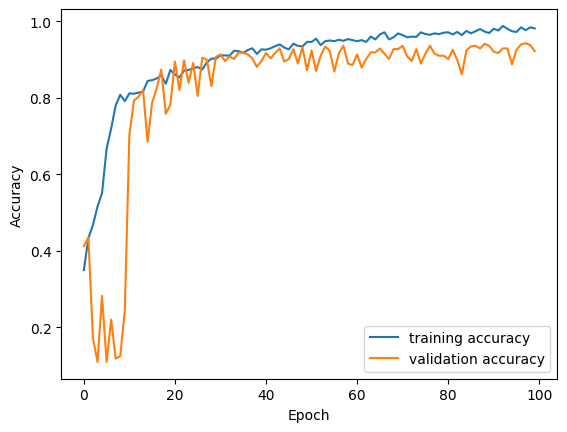

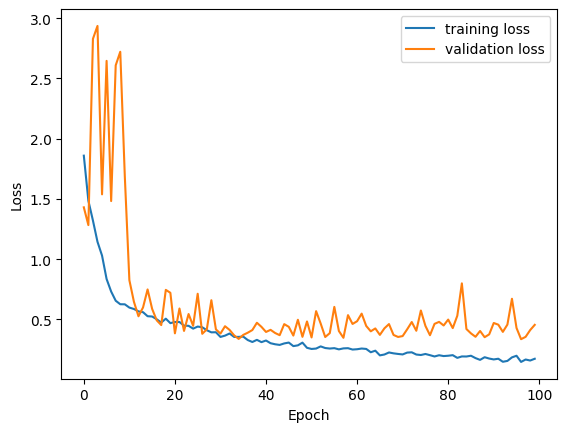

19/19 [==============================] - 1s 23ms/step


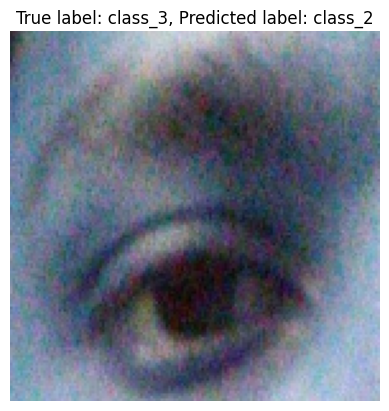

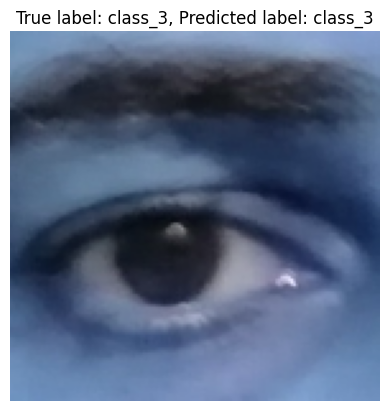

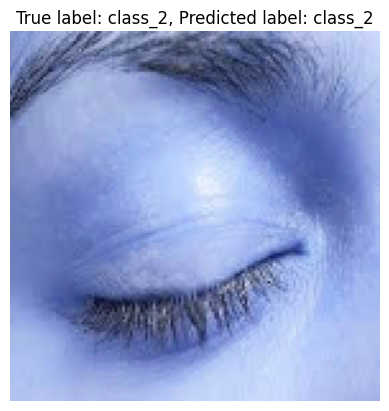

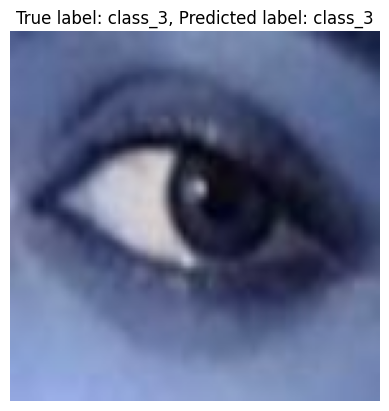

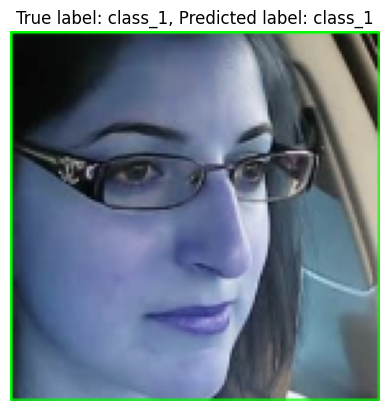

...

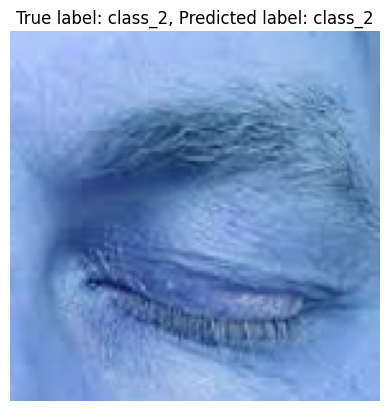

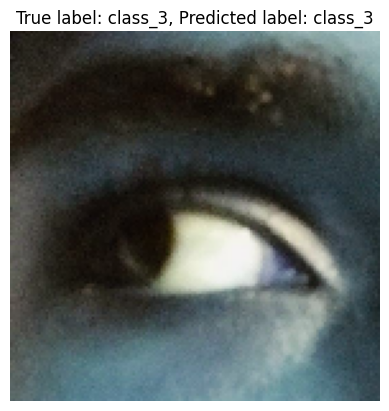

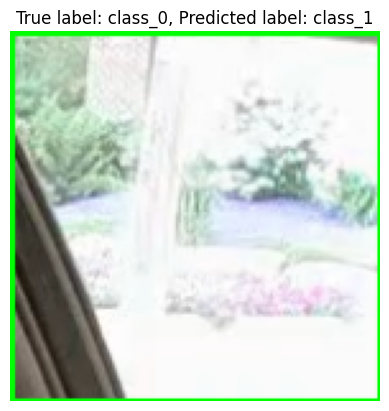

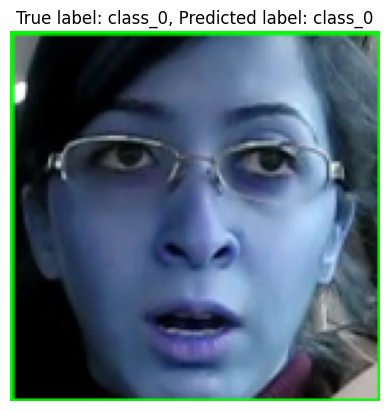

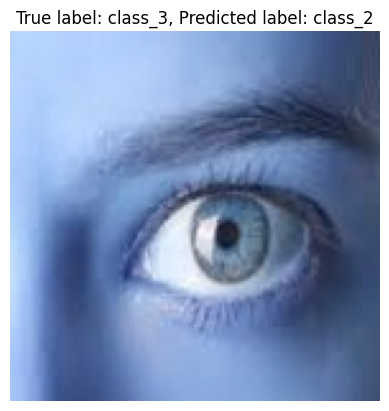

              precision    recall  f1-score   support

     class_0       0.98      0.67      0.79        63
     class_1       0.78      0.99      0.87        74
     class_2       0.93      0.96      0.95       215
     class_3       0.96      0.93      0.95       226

    accuracy                           0.92       578
   macro avg       0.91      0.89      0.89       578
weighted avg       0.93      0.92      0.92       578



In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, LSTM, Dense, Dropout, BatchNormalization, Reshape
from keras.optimizers import Adam
from keras.regularizers import l2
from keras.callbacks import ReduceLROnPlateau
from keras.constraints import max_norm
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

def build_crnn_model(input_shape, num_classes):
    model = Sequential()

    # Convolutional layers
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(128, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Flatten())

    # Recurrent layers
    model.add(Reshape((-1, 128)))  # Reshape for LSTM
    model.add(LSTM(256, activation="tanh", return_sequences=True))
    model.add(Dropout(0.3))
    model.add(BatchNormalization())

    model.add(LSTM(128, activation="tanh", return_sequences=True))
    model.add(Dropout(0.3))
    model.add(BatchNormalization())

    model.add(LSTM(128, activation="tanh"))
    model.add(Dropout(0.3))
    model.add(BatchNormalization())

    # Fully connected layers
    model.add(Dense(128, activation="relu", kernel_regularizer=l2(0.001), kernel_constraint=max_norm(3)))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))

    model.add(Dense(num_classes, activation="softmax"))

    return model

# Define model
crnn_model = build_crnn_model(input_shape=X_train.shape[1:], num_classes=4)

# Compile model
optimizer = Adam(lr=0.0005, clipnorm=1.0)
crnn_model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])

# Summary
crnn_model.summary()

# Adding learning rate scheduler
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.0001)

# Training
history = crnn_model.fit(X_train, y_train, epochs=100, batch_size=64, validation_data=(X_test, y_test), callbacks=[reduce_lr])

# Evaluation on test data
evaluation = crnn_model.evaluate(X_test, y_test)
print("Test Loss:", evaluation[0])
print("Test Accuracy:", evaluation[1])

# Plotting
def plot_history(history):
    plt.plot(history.history['accuracy'], label='training accuracy')
    plt.plot(history.history['val_accuracy'], label='validation accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    plt.plot(history.history['loss'], label='training loss')
    plt.plot(history.history['val_loss'], label='validation loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

plot_history(history)

# Predict on test data
predictions = crnn_model.predict(X_test)
predicted_classes = np.argmax(predictions, axis=1)

# Manually specify class labels
class_labels = ["class_0", "class_1", "class_2", "class_3"]

# Convert one-hot encoded true labels to single labels
true_classes = np.argmax(y_test, axis=1)

# Display true labels and predictions for some images
num_images_to_display = 20
for i in range(num_images_to_display):
    true_label = class_labels[true_classes[i]]
    predicted_label = class_labels[predicted_classes[i]]

    # Display the image
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(f"True label: {true_label}, Predicted label: {predicted_label}")
    plt.show()

# Print classification report
print(classification_report(true_classes, predicted_classes, target_names=class_labels))


In [ ]:
crnn_model.save("crnn_model.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


**Hybrid Model-CNN + LSTM**

Model: "sequential_28"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_58 (Conv2D)          (None, 143, 143, 32)      896       
                                                                 
 max_pooling2d_58 (MaxPooli  (None, 71, 71, 32)        0         
 ng2D)                                                           
                                                                 
 conv2d_59 (Conv2D)          (None, 69, 69, 64)        18496     
                                                                 
 max_pooling2d_59 (MaxPooli  (None, 34, 34, 64)        0         
 ng2D)                                                           
                                                                 
 conv2d_60 (Conv2D)          (None, 32, 32, 128)       73856     
                                                                 
 max_pooling2d_60 (MaxPooli  (None, 16, 16, 128)     

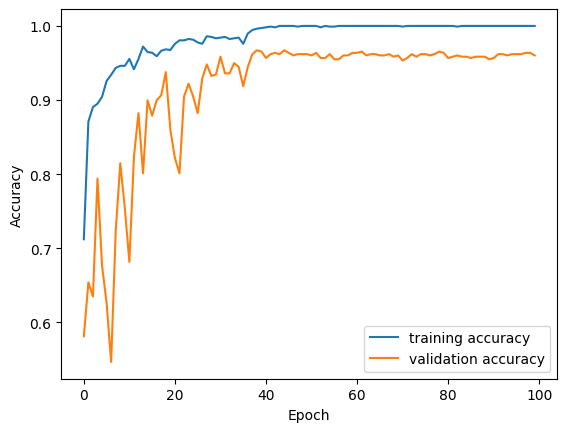

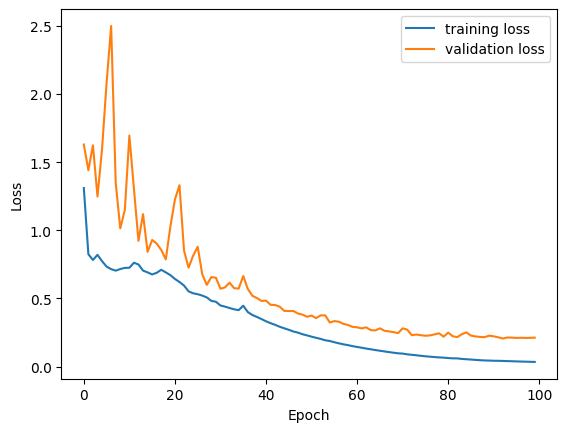

19/19 [==============================] - 1s 12ms/step


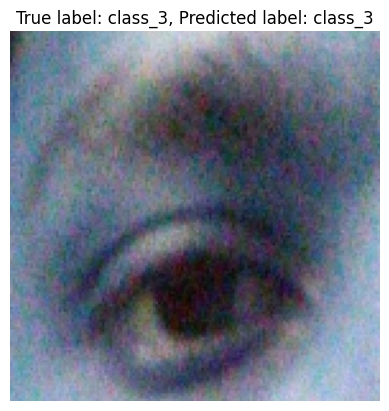

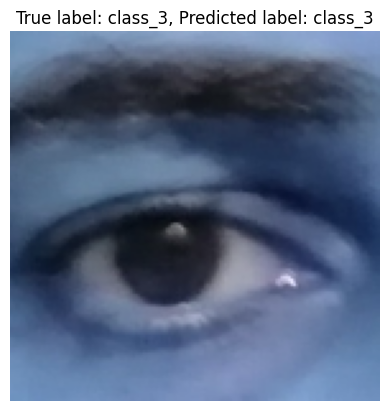

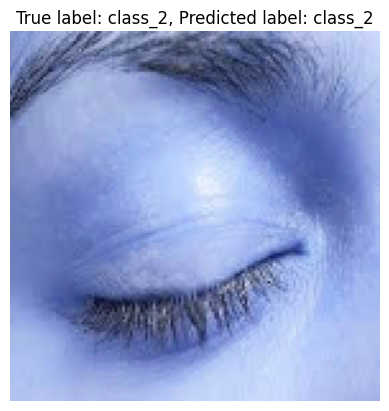

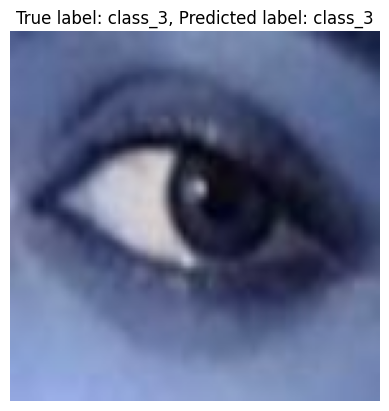

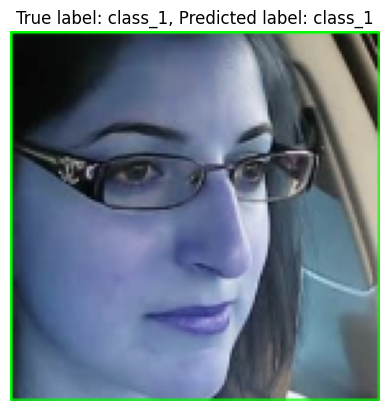

...

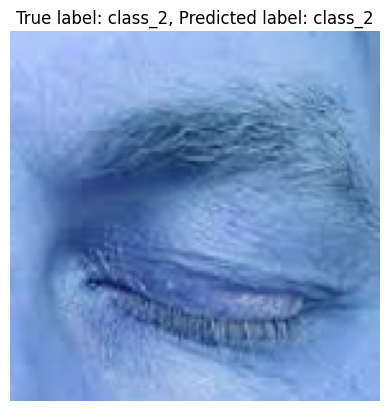

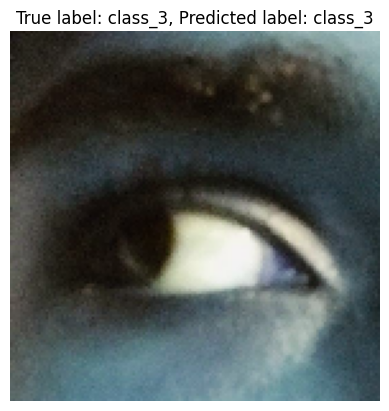

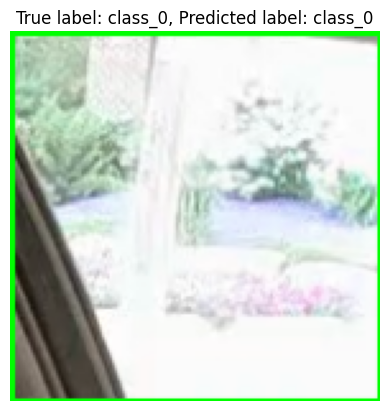

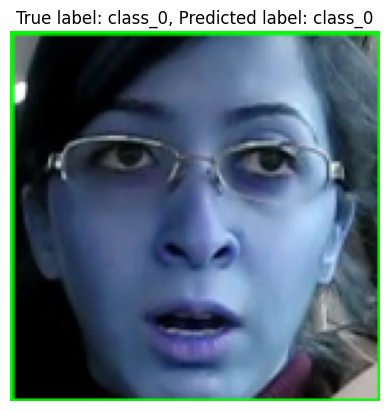

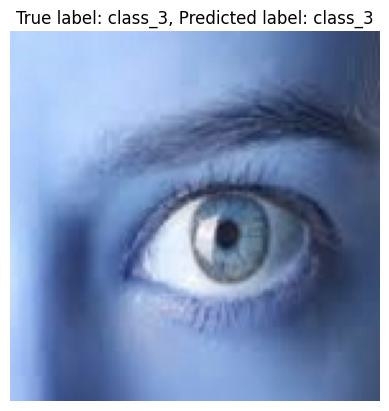

              precision    recall  f1-score   support

     class_0       0.87      0.87      0.87        63
     class_1       0.89      0.89      0.89        74
     class_2       1.00      0.97      0.98       215
     class_3       0.97      1.00      0.98       226

    accuracy                           0.96       578
   macro avg       0.93      0.93      0.93       578
weighted avg       0.96      0.96      0.96       578



In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, LSTM, Dense, Dropout, BatchNormalization, Reshape
from keras.optimizers import Adam
from keras.regularizers import l2
from keras.callbacks import ReduceLROnPlateau
from keras.constraints import max_norm
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

def build_hybrid_model(input_shape, num_classes):
    model = Sequential()

    # Convolutional layers
    model.add(Conv2D(32, (3, 3), activation='relu', input_shape=input_shape))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(64, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Conv2D(128, (3, 3), activation='relu'))
    model.add(MaxPooling2D((2, 2)))
    model.add(Flatten())

    # LSTM layer
    model.add(Reshape((-1, 128)))  # Reshape for LSTM
    model.add(LSTM(256, activation="tanh", return_sequences=True))
    model.add(Dropout(0.3))
    model.add(BatchNormalization())

    # Fully connected layers
    model.add(Flatten())
    model.add(Dense(128, activation="relu", kernel_regularizer=l2(0.001), kernel_constraint=max_norm(3)))
    model.add(BatchNormalization())
    model.add(Dropout(0.3))

    model.add(Dense(num_classes, activation="softmax"))

    return model

# Define model
hybrid_model = build_hybrid_model(input_shape=X_train.shape[1:], num_classes=4)

# Compile model
optimizer = Adam(lr=0.0005, clipnorm=1.0)
hybrid_model.compile(loss="categorical_crossentropy", optimizer=optimizer, metrics=["accuracy"])

# Summary
hybrid_model.summary()

# Adding learning rate scheduler
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.0001)

# Training
history = hybrid_model.fit(X_train, y_train, epochs=100, batch_size=64, validation_data=(X_test, y_test), callbacks=[reduce_lr])

# Evaluation on test data
evaluation = hybrid_model.evaluate(X_test, y_test)
print("Test Loss:", evaluation[0])
print("Test Accuracy:", evaluation[1])

# Plotting
def plot_history(history):
    plt.plot(history.history['accuracy'], label='training accuracy')
    plt.plot(history.history['val_accuracy'], label='validation accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    plt.plot(history.history['loss'], label='training loss')
    plt.plot(history.history['val_loss'], label='validation loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

plot_history(history)

# Predict on test data
predictions = hybrid_model.predict(X_test)
predicted_classes = np.argmax(predictions, axis=1)

# Manually specify class labels
class_labels = ["class_0", "class_1", "class_2", "class_3"]

# Convert one-hot encoded true labels to single labels
true_classes = np.argmax(y_test, axis=1)

# Display true labels and predictions for some images
num_images_to_display = 20
for i in range(num_images_to_display):
    true_label = class_labels[true_classes[i]]
    predicted_label = class_labels[predicted_classes[i]]

    # Display the image
    plt.imshow(X_test[i])
    plt.axis('off')
    plt.title(f"True label: {true_label}, Predicted label: {predicted_label}")
    plt.show()

# Print classification report
print(classification_report(true_classes, predicted_classes, target_names=class_labels))


In [ ]:
hybrid_model.save("hybrid_model.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


**Transfer Learning(pretrained VGG16)**

Model: "sequential_29"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten_21 (Flatten)        (None, 25088)             0         
                                                                 
 dense_59 (Dense)            (None, 512)               12845568  
                                                                 
 batch_normalization_68 (Ba  (None, 512)               2048      
 tchNormalization)                                               
                                                                 
 dropout_68 (Dropout)        (None, 512)               0         
                                                                 
 dense_60 (Dense)            (None, 256)               131328    
                                                     

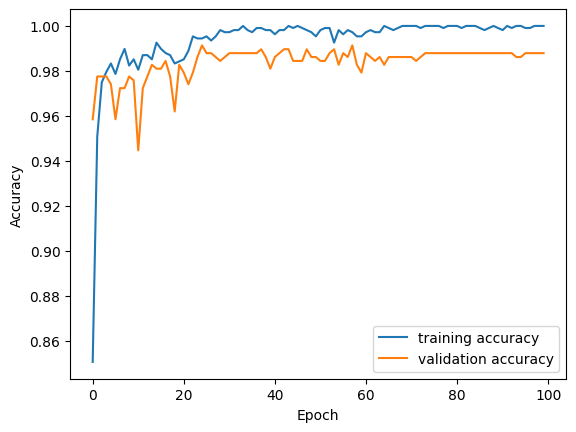

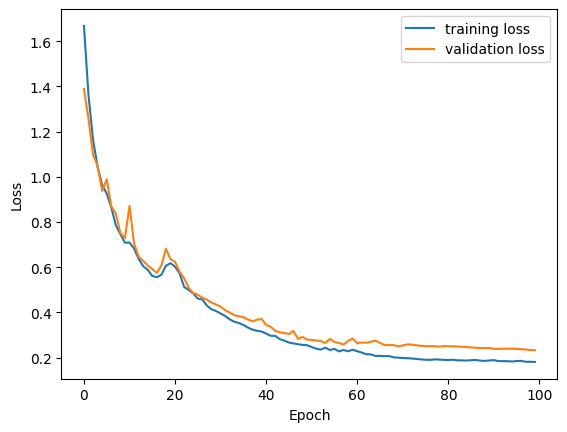

19/19 [==============================] - 2s 122ms/step


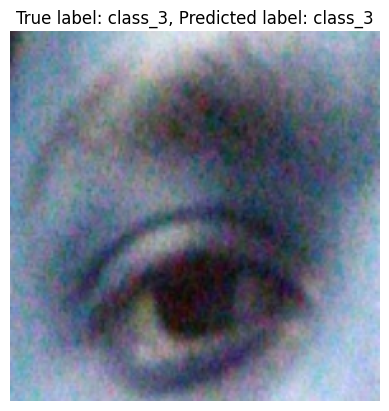

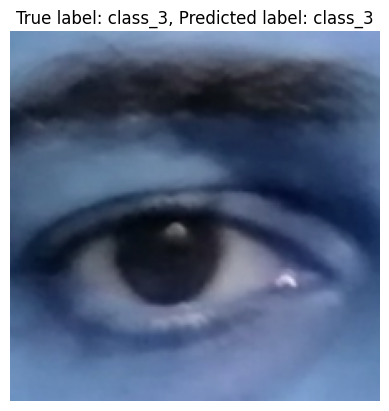

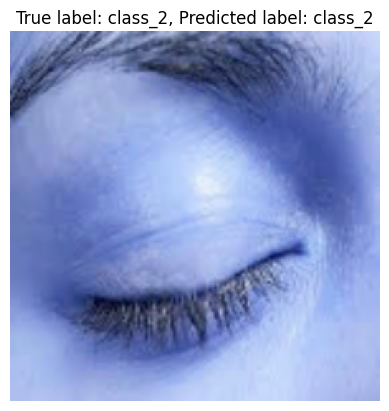

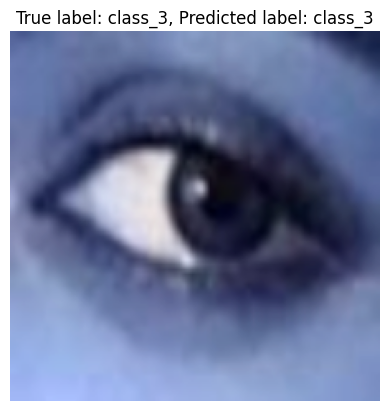

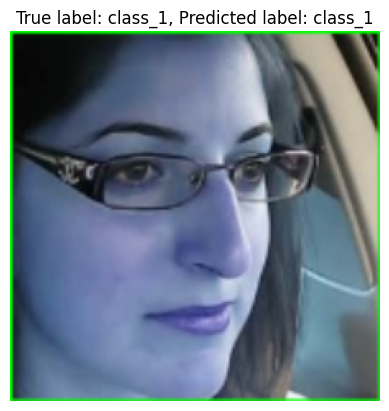

...

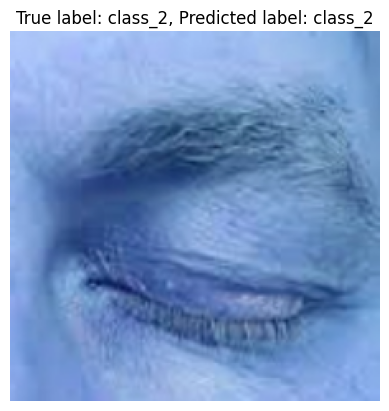

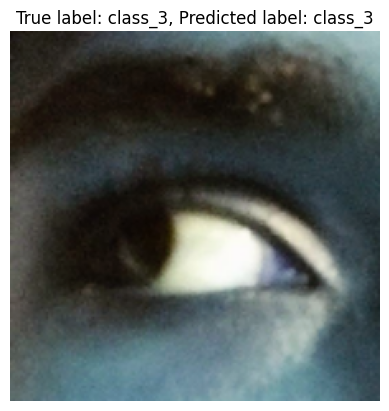

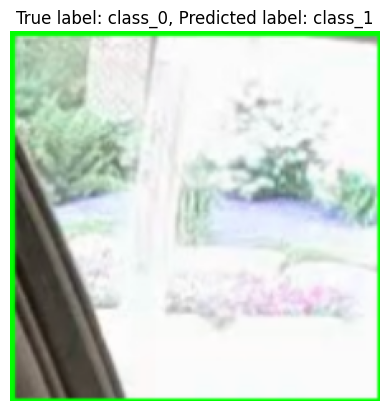

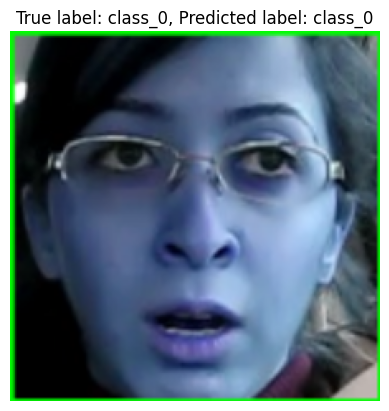

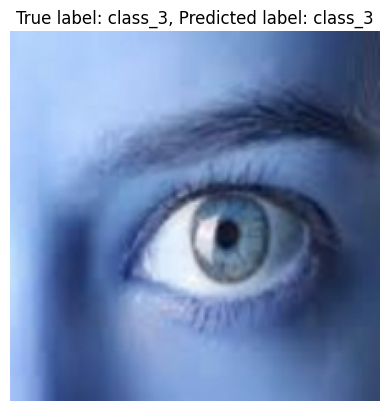

              precision    recall  f1-score   support

     class_0       0.97      0.94      0.95        63
     class_1       0.95      0.97      0.96        74
     class_2       1.00      1.00      1.00       215
     class_3       1.00      1.00      1.00       226

    accuracy                           0.99       578
   macro avg       0.98      0.98      0.98       578
weighted avg       0.99      0.99      0.99       578



In [ ]:
from keras.applications import VGG16
from keras.models import Sequential
from keras.layers import Dense, Flatten, Dropout, BatchNormalization
from keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau
from keras.regularizers import l2
from keras.preprocessing.image import img_to_array, array_to_img
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import classification_report

# Resize input images
X_train_resized = np.array([cv2.resize(img, (224, 224)) for img in X_train])
X_test_resized = np.array([cv2.resize(img, (224, 224)) for img in X_test])

# Load pre-trained VGG16 model without the top layer
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze the pre-trained layers
for layer in base_model.layers:
    layer.trainable = False

# Create a new model
transfer_model = Sequential()

# Add the pre-trained VGG16 base model
transfer_model.add(base_model)

# Flatten the output of VGG16 base model
transfer_model.add(Flatten())

# Add fully connected layers
transfer_model.add(Dense(512, activation='relu', kernel_regularizer=l2(0.001)))
transfer_model.add(BatchNormalization())
transfer_model.add(Dropout(0.5))

transfer_model.add(Dense(256, activation='relu', kernel_regularizer=l2(0.001)))
transfer_model.add(BatchNormalization())
transfer_model.add(Dropout(0.5))

transfer_model.add(Dense(4, activation='softmax'))

# Compile the model
optimizer = Adam(lr=0.0001)
transfer_model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy'])

# Summary
transfer_model.summary()

# Adding learning rate scheduler
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, min_lr=0.00001)

# Train the model
history = transfer_model.fit(X_train_resized, y_train, epochs=100, batch_size=32, validation_data=(X_test_resized, y_test), callbacks=[reduce_lr])

# Save the model
transfer_model.save("transfer_model.h5")

# Evaluation on test data
evaluation = transfer_model.evaluate(X_test_resized, y_test)
print("Test Loss:", evaluation[0])
print("Test Accuracy:", evaluation[1])

# Plotting
def plot_history(history):
    plt.plot(history.history['accuracy'], label='training accuracy')
    plt.plot(history.history['val_accuracy'], label='validation accuracy')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    plt.plot(history.history['loss'], label='training loss')
    plt.plot(history.history['val_loss'], label='validation loss')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

plot_history(history)

# Predict on test data
predictions = transfer_model.predict(X_test_resized)
predicted_classes = np.argmax(predictions, axis=1)

# Manually specify class labels
class_labels = ["class_0", "class_1", "class_2", "class_3"]

# Convert one-hot encoded true labels to single labels
true_classes = np.argmax(y_test, axis=1)

# Display true labels and predictions for some images
num_images_to_display = 20
for i in range(num_images_to_display):
    true_label = class_labels[true_classes[i]]
    predicted_label = class_labels[predicted_classes[i]]

    # Display the image
    plt.imshow(array_to_img(X_test_resized[i]))
    plt.axis('off')
    plt.title(f"True label: {true_label}, Predicted label: {predicted_label}")
    plt.show()

# Print classification report
print(classification_report(true_classes, predicted_classes, target_names=class_labels))


In [ ]:
transfer_model.save("transfer_model.h5")

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(
